<a href="https://colab.research.google.com/github/saaldera/Twitter_Scrap/blob/master/5_FastText_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FastText

In [ ]:
#allows us to create the Data and Figure objects
from plotly.graph_objs import *
#plotly.plotly pushes your charts to the cloud  
# import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.express as px
# import chart_studio.plotly as py

import matplotlib.pyplot as plt
%matplotlib inline

# work with cufflinks offline and set its theme
import plotly.io as pio
pio.templates.default = "plotly_white"


import pandas as pd
import numpy as np

# from utils import *

import os
import json
import re
import sys

In [ ]:
def plot_conf_matrix(conf_matrix_array, class_names, title='', normalized = False, colorscale='GnBu'):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`
    """

    z_vals = conf_matrix_array[::-1]
    
    title = 'Confusion Matrix<br>{0}'.format(title)
    
    if normalized:
        z_vals =  np.round(z_vals.astype('float')/z_vals.sum(axis=1)[:, np.newaxis], 3)
        title = 'Normalized ' + title
        
    fig = ff.create_annotated_heatmap(x = class_names,
                                      y = class_names[::-1],
                                      z = z_vals, colorscale=colorscale, showscale=True)
    
    
    
    fig.layout.update(title = title,
                      width=700, height=500,
                      yaxis = dict(title = 'True', side = 'left'),
                      xaxis = dict(title = 'Predicted', side = 'bottom'))
    return fig

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss
from sklearn.metrics import confusion_matrix as cm, classification_report as cr

metrics_map = {
    'Accuracy': accuracy_score,
    'Precision': precision_score,
    'Recall': recall_score,
    'F1-score': f1_score,
    'Logloss': log_loss
}

In [ ]:
def train_val_test_split(X, y, test_size, val_size, random_state, stratify):
    '''split a multi-labeled data into train, validation, and test sets using'''
    
    X_train, X_val_test, y_train, y_val_test = train_test_split(X, y,
                                                                test_size=val_size+test_size,
                                                                random_state=random_state,
                                                                stratify=stratify)
    
    
    
    X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test,
                                                    test_size=0.5,
                                                    random_state=random_state,
                                                    stratify=y_val_test)
    
    
    
    return X_train, X_val, X_test, y_train, y_val, y_test
    

In [ ]:
import tensorflow as tf
print(tf.__version__)
# # print(tf.test.gpu_device_name())
# # print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

2.3.0


In [ ]:
import tensorflow_datasets as tfds
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.optimizers import Adam

In [ ]:
# !pip install ktrain
# !pip install git+https://github.com/amaiya/eli5@tfkeras_0_10_1
# !pip install git+https://github.com/amaiya/stellargraph@no_tf_dep_082

In [ ]:
def print_full(x):
    pd.set_option('display.max_colwidth', None)
    return x

def reset():
    pd.reset_option('display.max_colwidth')

## Reading The Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PROJECT_PATH = '/content/drive/MyDrive/colab/saja'
DATA_PATH= '/content/drive/My Drive/colab/saja/data'
FILE_PATH = os.path.join(DATA_PATH, 'clean_data_2.csv')
MODEL_PATH='/content/drive/My Drive/colab/saja/models/fasttext'
IMG_PATH = '/content/drive/My Drive/colab/saja/assets'


if not os.path.isdir(MODEL_PATH):
  os.makedirs(MODEL_PATH)

if not os.path.isdir(PROJECT_PATH):
  os.makedirs(PROJECT_PATH)

In [ ]:
df = pd.read_csv(FILE_PATH)

In [ ]:
df.head(2)

,Date,Tweet,Favourite count,Retweet count,Language,Author,In_reply_to_screen_name,In_reply_to_user_id_str,In_reply_to_status_id_str,Username,Radicalism,Year,Month,Week,Day,Dayofweek,Hour,Tweet_Lemma_Retweet,Tweet_Lemma
0,2012-07-19 18:05:30,الامير بندر بن سلطان رئيسا للاستخبارت السعوديه,0,0,ar,azfi77,NaN,NaN,NaN,azfi77,Nonradical,2012,July,29,19,Thursday,18,الامير بندر بن سلطان رئيسا للاستخبارت السعوديه,الامير بندر بن سلطان رئيسا للاستخبارت السعوديه
1,2012-07-25 10:49:13,دعاء القارئ الشيخ ناصر بن علي القطامي لأهل سور...,0,0,ar,azfi77,NaN,NaN,NaN,azfi77,Nonradical,2012,July,30,25,Wednesday,10,دعاء القارئ الشيخ ناصر بن علي القطامي لاهل سور...,دعاء القارئ الشيخ ناصر بن علي القطامي لاهل سور...


In [ ]:
features = 'Tweet'
features_lemma = 'Tweet_Lemma'
target = 'Radicalism'
classes = sorted(df[target].unique())
classes

['Nonradical', 'Radical', 'Unrelated']

In [ ]:
# import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss, roc_auc_score
from sklearn.metrics import confusion_matrix as cm, classification_report as cr

metrics_dict =  {'Accuracy': accuracy_score,
                 'Precision': precision_score,
                 'Recall': recall_score,
                 'F1-score': f1_score,
                 'Logloss': log_loss,
                 'AUC': roc_auc_score}

In [ ]:
classes = sorted(df[target].unique())
def pretty_cm(y_true, y_pred, classes=classes, normalized=True):
    # if y_true is one-hot-encoded --> collapse it 
    y_true = y_true.argmax(axis=1) if len(y_true.shape) > 1 else y_true
    
    confusion_mtx = cm(y_true, y_pred)
    cm_df = pd.DataFrame(confusion_mtx, index=classes, columns=classes)
    
    if normalized:
        cm_df = cm_df.apply(lambda row: row/row.sum(), axis=1).round(4)
    return cm_df

In [ ]:
def pretty_cr(y_true, y_pred, classes=classes):
    # if y_true is one-hot-encoded --> collapse it 
    y_true = y_true.argmax(axis=1) if len(y_true.shape) > 1 else y_true
    report = cr(y_true, y_pred, output_dict=True, target_names=classes)
    cr_df = pd.DataFrame(report).transpose()
    
    # support is just the number of samples in each class
    cr_df['support'] = cr_df['support'].astype('int')
    
    # accuracy has no micro or macro averaging!
    cr_df.loc['accuracy', ['precision', 'recall']] = ""
    cr_df.loc['accuracy', ['support']] = len(y_true)
    
    # remove the accuracy row to the end
    acc_row = cr_df.loc['accuracy']
    cr_df.drop('accuracy', axis=0, inplace=True)
    cr_df = cr_df.append(acc_row)
    
    return cr_df

In [ ]:
# %reload_ext autoreload
# %autoreload 2
# %matplotlib inline
# import os
# os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID";
# os.environ["CUDA_VISIBLE_DEVICES"]="0"; 

In [ ]:
# len(vectorize_layer.get_vocabulary())

In [ ]:
# tf.config.list_physical_devices('GPU')

In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = train_val_test_split(df[features_lemma].values, 
                                                                      df[target].values,
                                                                      test_size=0.15,
                                                                      val_size=0.15,
                                                                      random_state=1,
                                                                      stratify=df[target])

## How to Tkenize, Preprocess and prepare Text Using tensorflow.keras

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

1. Create a tokenizer instance and fit it on the texts
   (Fitting means learning the vocabulary)

In [ ]:
sentences = [
             'I like the food',
             'I like the service',
             'You like the food!',
             'Do you think the food is amazing?'
]

tokenizer = Tokenizer(num_words=100)
tokenizer.fit_on_texts(sentences)

tokenizer.word_index

{'amazing': 10,
 'do': 7,
 'food': 3,
 'i': 4,
 'is': 9,
 'like': 2,
 'service': 6,
 'the': 1,
 'think': 8,
 'you': 5}

2. Transform the texts to convert it into sequences 

In [ ]:
sequences = tokenizer.texts_to_sequences(sentences)

In [ ]:
print(sentences, '\n')
print(tokenizer.word_index, '\n')
print(sequences)

['I like the food', 'I like the service', 'You like the food!', 'Do you think the food is amazing?'] 

{'the': 1, 'like': 2, 'food': 3, 'i': 4, 'you': 5, 'service': 6, 'do': 7, 'think': 8, 'is': 9, 'amazing': 10} 

[[4, 2, 1, 3], [4, 2, 1, 6], [5, 2, 1, 3], [7, 5, 8, 1, 3, 9, 10]]


**Note** at inference time we encode the new sentences with using the same dictionary created from the training data. See the example below

In [ ]:
test_sentences = ["I really like the food"]

test_seq = tokenizer.texts_to_sequences(test_sentences)

print(test_seq)  # note how it discarded the word "really" because it wasn't in the dictionary

[[4, 2, 1, 3]]


3. Use Padding to ensure all sequences are of the same length
   

In [ ]:
padded = pad_sequences(sequences)
padded

array([[ 0,  0,  0,  4,  2,  1,  3],
       [ 0,  0,  0,  4,  2,  1,  6],
       [ 0,  0,  0,  5,  2,  1,  3],
       [ 7,  5,  8,  1,  3,  9, 10]], dtype=int32)

**Note** By default, the padded sequences take the length of the longest sequence in the list. You can override that with the argument `maxlen` in the `pad_sequences` function

In [ ]:
padded = pad_sequences(sequences, maxlen=10)
padded

array([[ 0,  0,  0,  0,  0,  0,  4,  2,  1,  3],
       [ 0,  0,  0,  0,  0,  0,  4,  2,  1,  6],
       [ 0,  0,  0,  0,  0,  0,  5,  2,  1,  3],
       [ 0,  0,  0,  7,  5,  8,  1,  3,  9, 10]], dtype=int32)

<img src="https://drive.google.com/file/d/1a63T2F_UARE0bqLBqE1NMTNaomfeG_oQ/view?usp=sharing">

### Applying on our Data

To choose max_features we ran a test on our logistic regression model. Changed the size of vocabulary and tried 50,000, 40,000, 30,000, and 20,000. Results began to decrease at 20,000. So we chose 30,000.

Also, this is the numbre of features chosen by BERT model authors


also this article here:
https://www.economist.com/johnson/2013/05/29/lexical-facts

In [ ]:
(df[features_lemma].apply(lambda x: len(x.split())).quantile(0.99)) 

27.0

In [ ]:
max_features = 10000  # Maximum vocab size.
max_len = 32         # max sequence length (max no. of words allowed in a single review)
embedding_dim = 64   # embedding dimension (each word will be represented by a vector of that size) (from the fast-text paper)

In [ ]:
from tensorflow.keras.utils import plot_model

In [ ]:
import ktrain
from ktrain import text

In [ ]:
ktrain.__version__

'0.25.2'

In [ ]:
from  ktrain.text.preprocessor import StandardTextPreprocessor

In [ ]:
preproc = StandardTextPreprocessor(maxlen=max_len, max_features=max_features, class_names=classes, lang='ar')

In [ ]:
%%time
trn = preproc.preprocess_train(X_train, y_train)

language: ar
Word Counts: 52292
Nrows: 16240
16240 train sequences
train sequence lengths:
	mean : 12
	95percentile : 21
	99percentile : 24
x_train shape: (16240,32)
y_train shape: (16240, 3)
Is Multi-Label? False
CPU times: user 771 ms, sys: 11.5 ms, total: 783 ms
Wall time: 780 ms


/usr/local/lib/python3.6/dist-packages/ktrain/utils.py:589: UserWarning:

class_names argument was ignored, as they were extracted from string labels in dataset



In [ ]:
classes

['Nonradical', 'Radical', 'Unrelated']

In [ ]:
trn[1]

array([[0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       ...,
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]], dtype=float32)

In [ ]:
val = preproc.preprocess_test(X_val, y_val)

3480 test sequences
test sequence lengths:
	mean : 11
	95percentile : 20
	99percentile : 23
x_test shape: (3480,32)
y_test shape: (3480, 3)


In [ ]:
test = preproc.preprocess_test(X_test, y_test)

3481 test sequences
test sequence lengths:
	mean : 12
	95percentile : 21
	99percentile : 23
x_test shape: (3481,32)
y_test shape: (3481, 3)


In [ ]:
text.print_text_classifiers()

fasttext: a fastText-like model [http://arxiv.org/pdf/1607.01759.pdf]
logreg: logistic regression using a trainable Embedding layer
nbsvm: NBSVM model [http://www.aclweb.org/anthology/P12-2018]
bigru: Bidirectional GRU with pretrained fasttext word vectors [https://fasttext.cc/docs/en/crawl-vectors.html]
standard_gru: simple 2-layer GRU with randomly initialized embeddings
bert: Bidirectional Encoder Representations from Transformers (BERT) from keras_bert [https://arxiv.org/abs/1810.04805]
distilbert: distilled, smaller, and faster BERT from Hugging Face transformers [https://arxiv.org/abs/1910.01108]


## Building Fast-text-like Model

In [ ]:
from keras.models import Sequential
from keras.layers import (Embedding, SpatialDropout1D, GlobalMaxPool1D, GlobalAveragePooling1D, BatchNormalization, Dense, Dropout)

In [ ]:
def build_model(num_classes,           # target property
                max_len, max_features,  # features properties
                # model propreties
                loss_func='categorical_crossentropy', hidden_activation='relu', out_activation='softmax', optimizer='Adam', 
                # reporting purposes
                metrics=['accuracy'],  verbose=1):

    model = Sequential()
    model.add(Embedding(max_features, 64, input_length=max_len))
    model.add(SpatialDropout1D(0.5))
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation=hidden_activation, kernel_initializer='he_normal'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation=out_activation))

    model.compile(loss=loss_func, optimizer='Adam', metrics=metrics)

    return model

https://ruder.io/deep-learning-nlp-best-practices/index.html#dropout

Note: there are 2 differences between the fast-text model implemented in the paper and our version of it:

1. They used word-piece embeddings, while we used normal whole-token embeddings
2. They used average pooling while we used max pooling

In [ ]:
model = build_model(num_classes=3, max_len=max_len, max_features=max_features)

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 32, 64)            640000    
_________________________________________________________________
spatial_dropout1d_2 (Spatial (None, 32, 64)            0         
_________________________________________________________________
global_max_pooling1d_2 (Glob (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 64)                4160      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 3)                 195       
Total params: 644,355
Trainable params: 644,355
Non-trainable params: 0
________________________________________________

In [ ]:
from tensorflow.keras.utils import plot_model

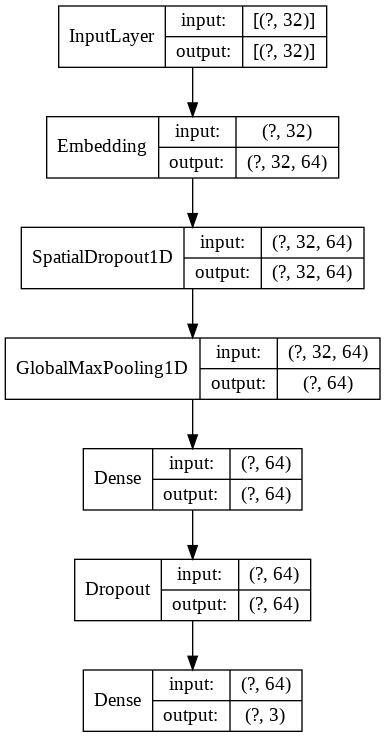

In [ ]:
plot_model(model, show_layer_names=False, show_shapes=True)

### Notes on the Embeddings Learned Here

Think of the word embedddings learned in the context of a sentiment classification problem like this:

You have words in a document and often words that have similar meanings are close to each other. For example, in a movie review, it might say that the movie was dull and boring, or it might say that it was fun and exciting. 

So what if you could pick a vector in a higher-dimensional space say 300 dimensions, and words that are found together are given similar vectors. Then over time, words can begin to cluster together. 

The meaning of the words can come from the labeling of the dataset. 

So in this case, the words dull and boring show up a lot in the negative review so that they have similar sentiment, and they are close to each other in the sentence. Thus their vectors will be similar. 

As the neural network trains, it can then learn these vectors, associating them with the labels to come up with what's called an embedding i.e., the vectors for each word with their associated sentiment. 

The results of the embedding will be a 2D array with dimensions (max_len x d), where max_len is the length of the document, and d is the vector dimension.

In [ ]:
learner = ktrain.get_learner(model,
                             train_data=trn,
                             val_data = val,
                             batch_size=128)

In [ ]:
# learner.set_weight_decay(0.001)

## STOPPED HERE

### A Learning Rate Finder

The Learner object can be used to find the best learning rate for your model.  First, we use ```lr_find``` to track the loss as the learning rate is increased and then use ```lr_plot``` to identify the maximal learning rate associated with a falling loss.

In [ ]:
learner.lr_find(max_epochs=10)

simulating training for different learning rates... this may take a few moments...
Epoch 1/10
127/127 [==============================] - 1s 7ms/step - loss: 1.1228 - accuracy: 0.2166
Epoch 2/10
127/127 [==============================] - 1s 6ms/step - loss: 1.1230 - accuracy: 0.2191
Epoch 3/10
127/127 [==============================] - 1s 6ms/step - loss: 1.1186 - accuracy: 0.2376
Epoch 4/10
127/127 [==============================] - 1s 6ms/step - loss: 1.0930 - accuracy: 0.3610
Epoch 5/10
127/127 [==============================] - 1s 6ms/step - loss: 0.9621 - accuracy: 0.5002
Epoch 6/10
127/127 [==============================] - 1s 6ms/step - loss: 0.7250 - accuracy: 0.6840
Epoch 7/10
127/127 [==============================] - 1s 6ms/step - loss: 0.6324 - accuracy: 0.7389
Epoch 8/10
127/127 [==============================] - 1s 6ms/step - loss: 0.8945 - accuracy: 0.5746
Epoch 9/10
127/127 [==============================] - 1s 6ms/step - loss: 1.0860 - accuracy: 0.4735
Epoch 10/10
127/1

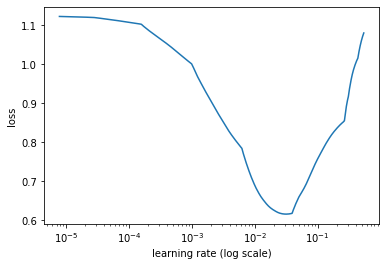

In [ ]:
learner.lr_plot(300, 200)

We would like the maximal learning rate associated with a still-falling loss (prior the loss diverging).  Based on the plot, we will start with a learning rate of `3e-3`

## Training with Learning Rate Schedules

This is from Ktrain Docs:

Varying the learning rate cyclically during training has been shown to be [effective](https://arxiv.org/abs/1506.01186) and a good general practice.  *ktrain* allows you to easily employ a variety of demonstrably effective learning rate policies during training. These include:

* a [triangular learning rate policy](https://arxiv.org/abs/1506.01186) available via the ```autofit``` method
* a [1cycle policy](https://arxiv.org/abs/1803.09820) available via the ```fit_onecycle``` method
* an [SGDR](https://arxiv.org/abs/1608.03983) (Stochastic Gradient Descent with Restart) schedule available using the ```fit``` method by supplying a *cycle_len* argument.

The ```autofit``` and ```fit_onecycle``` methods tend to be good choices that produce pleasing results.  For more information on learning rate schedules, see the [*ktrain* tutorial notebook on tuning learning rates](https://github.com/amaiya/ktrain/blob/master/tutorials/tutorial-02-tuning-learning-rates.ipynb).

The ```autofit``` method in *ktrain* employs a triangular learning rate schedule and uses the supplied learning rate as the maximum learning rate.  The ```autofit``` method accepts two primary arguments. The first (required) is the learning rate (**lr**) to be used, which can be found using the learning rate finder above. The second is optional and indicates the number of epochs (**epochs**) to train.  If **epochs** is not supplied as a second argument, then ```autofit``` will train until the validation loss no longer improves after a certain period. This period can be configured using the **early_stopping** argument.  The ```autofit``` method will also reduce the learning rate when validation loss no longer improves, which can be configured using the reduce_on_plateau argument to ```autofit```.  At the end of training, the weights producing the lowest validation loss are automatically loaded into the model.


The ```autofit``` method also accepts a **checkpoint_folder** argument representing the path to a directory. If supplied, the weights of the model after each epoch will be saved to this folder.  Thus, the model state of any epoch can be easily restored using the ```learner.model.load_weights``` method, if the final validation accuracy is not desired. In this case, the final accuracy is quite satisfactory for this model.  

see explanation here: https://course.fast.ai/videos/?lesson=3, at 1:19:35

And this paper as well:
https://papers.nips.cc/paper/7875-visualizing-the-loss-landscape-of-neural-nets.pdf

#### Using Autofit

Finally, we invoke autofit without supplying the number of epochs. As mentioned, the training will automatically stop when the validation loss fails to improve. Moreover, the maximum learning rate will automatically decrease periodically. We supply the checkpoint_folder argument to ensure we can restore the weights from any epoch after training completes.

The ```autofit``` method in *ktrain* employs a default cyclical learning rate schedule that tends to work well in practice.  The default learning rate schedule in ```autofit``` is currently the [triangular learning rate policy](https://arxiv.org/abs/1506.01186), which some slight modifications.

#### Setting Global Weight Decay in Keras

[Weight decay](https://machinelearningmastery.com/how-to-reduce-overfitting-in-deep-learning-with-weight-regularization/) is a form of regularization to reduce overfitting.  In Keras, this is typically done by [setting the weight decay for individual layers within the network](https://github.com/keras-team/keras/issues/2717).  The global weight decay for a neural model can easily be set by the ```learner.set_weight_decay``` method.    


In [ ]:
# rebuild the model to train from scratch 
learner.set_model(build_model(num_classes=3, max_len=max_len, max_features=max_features))

In [ ]:
learner.set_weight_decay(0.01)

/usr/local/lib/python3.6/dist-packages/ktrain/core.py:357: UserWarning:

recompiling model to use AdamWeightDecay as opimizer with weight decay of 0.01



In [ ]:
learner.autofit(lr=3e-3, epochs=5, checkpoint_folder=MODEL_PATH)



begin training using triangular learning rate policy with max lr of 0.003...
Epoch 1/5
127/127 [==============================] - 2s 13ms/step - loss: 0.8572 - accuracy: 0.5844 - val_loss: 0.6622 - val_accuracy: 0.7270
Epoch 2/5
127/127 [==============================] - 2s 14ms/step - loss: 0.6575 - accuracy: 0.7242 - val_loss: 0.5621 - val_accuracy: 0.7621
Epoch 3/5
127/127 [==============================] - 2s 12ms/step - loss: 0.5556 - accuracy: 0.7695 - val_loss: 0.5149 - val_accuracy: 0.7830
Epoch 4/5
127/127 [==============================] - 1s 12ms/step - loss: 0.4702 - accuracy: 0.8128 - val_loss: 0.4964 - val_accuracy: 0.7957
Epoch 5/5
127/127 [==============================] - 2s 14ms/step - loss: 0.4110 - accuracy: 0.8409 - val_loss: 0.4941 - val_accuracy: 0.8006


### Weight Decay (L2 Regularization)

Weight decay, or *L2 regularization*, consists in adding to your loss function the sum of all the weights squared. Why do that? Because when we compute the gradients, it will add a contribution to them that will encourage the weights to be as small as possible.

Why would it prevent overfitting? The idea is that the larger the coefficients are, the sharper canyons we will have in the loss function. If we take the basic example of a parabola, `y = a * (x**2)`, the larger `a` is, the more *narrow* the parabola is (<<parabolas>>).

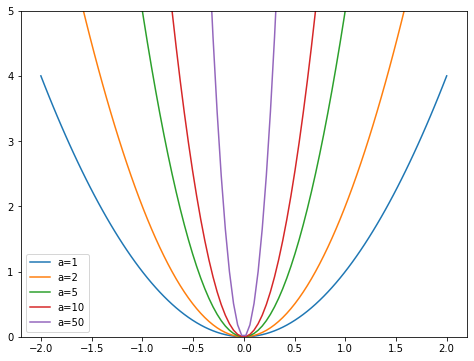

In [ ]:
#hide_input
#id parabolas
x = np.linspace(-2,2,100)
a_s = [1,2,5,10,50] 
ys = [a * x**2 for a in a_s]
_,ax = plt.subplots(figsize=(8,6))
for a,y in zip(a_s,ys): ax.plot(x,y, label=f'a={a}')
ax.set_ylim([0,5])
ax.legend();

So, letting our model learn high parameters might cause it to fit all the data points in the training set with an overcomplex function that has very sharp changes, which will lead to overfitting.

Limiting our weights from growing too much is going to hinder the training of the model, but it will yield a state where it generalizes better. Going back to the theory briefly, weight decay (or just `wd`) is a parameter that controls that sum of squares we add to our loss (assuming `parameters` is a tensor of all parameters):

``` python
loss_with_wd = loss + wd * (parameters**2).sum()
```

In practice, though, it would be very inefficient (and maybe numerically unstable) to compute that big sum and add it to the loss. If you remember a little bit of high school math, you might recall that the derivative of `p**2` with respect to `p` is `2*p`, so adding that big sum to our loss is exactly the same as doing:

``` python
parameters.grad += wd * 2 * parameters
```

The ```autofit``` method runs a triangular learning rate schedule with two modifications.  First, it annihilates the learning rate at the end of each cycle:

In [ ]:
# a helper function to get the id of best epoch in terms of a desired metric
hist = learner.history.history

In [ ]:
def get_best_epoch(metric): 
    return np.argmax(hist[metric]) + 1 if metric=='val_accuracy' else np.argmin(hist[metric])+1

best = get_best_epoch('val_loss')

In [ ]:
best

5

In [ ]:
learner.model.load_weights(f'{MODEL_PATH}/weights-{best:02d}.hdf5')

In [ ]:
hist_df = pd.DataFrame(
    {
        'Accuracy': hist['accuracy'],
        'Loss': hist['loss'],
        'Validation Accuracy': hist['val_accuracy'],
        'Validation Loss': hist['val_loss']
        
     
    },
    index = np.arange(1, len(hist['accuracy'])+1)
)

hist_df

,Accuracy,Loss,Validation Accuracy,Validation Loss
1,0.584360,0.857199,0.727012,0.662150
2,0.724200,0.657484,0.762069,0.562073
3,0.769458,0.555616,0.783046,0.514881
4,0.812808,0.470182,0.795690,0.496449
5,0.840948,0.411036,0.800575,0.494122


In [ ]:
from plotly.subplots import make_subplots
def plot_performance(hist_df, title = 'Performance Report', subtitle=''):
    
    fig = make_subplots(rows=1, cols=2, shared_xaxes=True, print_grid=False,
                        subplot_titles=['Accuracy', 'Cross Entropy Loss'])
    
    names = ['Train', 'Validation']
    
    colors = {'Accuracy': 'blue', 'Loss': 'blue', 'Validation Accuracy': 'red', 'Validation Loss': 'red'}

    for i, col in enumerate(hist_df.filter(regex='Accuracy',axis=1)):
        fig.append_trace(Scatter(x=hist_df.index, y=hist_df[col], 
                                 mode='lines+markers',
                                 opacity=0.6,
                                 name=names[i], 
                                 marker=dict(color=colors[col],
                                             size=11,
                                             opacity=0.7,
                                             line=dict(width=2, color='white'))), 
                         # insert both traces in the 1st subplot
                         1, 1)
    
    for i,col in enumerate(hist_df.filter(regex='Loss', axis=1)):
        fig.append_trace(Scatter(x=hist_df.index, y=hist_df[col], 
                                 mode='lines+markers',
                                 opacity=0.6,
                                 name=names[i], 
                                 marker=dict(color=colors[col],
                                             size=12,
                                             opacity=0.6,
                                             line=dict(width=2, color='white')), showlegend=False), 1, 2)

    fig['layout'].update(dict(xaxis1=dict(title = 'Epoch'),
                              xaxis2=dict(title = 'Epoch'),
                              yaxis1=dict(tickformat='.1%')))
    
    # add title and subtitle to the plot
    fig.add_annotation(
        dict(text = '{title}'.format(title=title),
             xref = 'paper',
             yref = 'paper',
             x = -0.035,
             y = 1.27,
             font = dict(size=23),
             showarrow = False),
    ),

    fig.add_annotation(
        # subtitle
        dict(text = '{subtitle}'.format(subtitle=subtitle),
             xref = 'paper',
             yref = 'paper',
             x = -0.035,
             y = 1.18,
             font = dict(size=17),
             showarrow = False)
    )
                                     
                                     
    
    fig.show()

In [ ]:
plot_performance(hist_df, subtitle='Fast Text')

In [ ]:
lr_df = pd.DataFrame(
    {
        'Learning Rate': hist['lr'],
        'Iteration': hist['iterations']
    },
    index = np.arange(1, len(hist['lr'])+1)
)

In [ ]:
lr_df

,Learning Rate,Iteration
1,0.000300,1.0
2,0.000342,2.0
3,0.000384,3.0
4,0.000427,4.0
5,0.000469,5.0
...,...,...
631,0.000471,631.0
632,0.000424,632.0
633,0.000378,633.0
634,0.000331,634.0


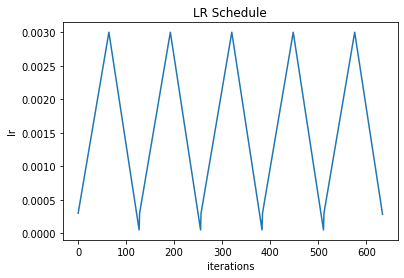

In [ ]:
learner.plot('lr')

In [ ]:
len(X_train)/128

126.875

In [ ]:
(
    px.line(lr_df, x='Iteration', y='Learning Rate', title='LR Schedule (Triangular Lerning Rate Policy)')
     .update_traces(line=dict(width=1.5))
)

In [ ]:
def evaluate(model, X, y, 
             metrics=['Logloss', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1-score'],
             classes = classes,
             test_set_name='Validation'):
    
    # for log_loss we need the probabilities
    pred = model.predict(X)
    
    # if y is not one-hot-encoded --> encode it as such
    loss = log_loss(pd.get_dummies(y) if len(y.shape) == 1 else y, pred)
    
    auc = roc_auc_score(pd.get_dummies(y) if len(y.shape) == 1 else y, pred, average='weighted')
    
    # for all other scores we need the classes, not probabilities
    pred_cats = pred.argmax(axis=1)
    
    # if y is one-hot-encoded --> collapse it to a single vector
    y = y.argmax(axis=1) if len(y.shape) > 1 else y
    
    acc = accuracy_score(y, pred_cats)
    f1 = f1_score(y, pred_cats, average='weighted')
    prec = precision_score(y, pred_cats, average='weighted')
    rec = recall_score(y, pred_cats, average='weighted')
    
    
    
    scores = np.array([loss, auc, acc, prec, rec, f1]).reshape(1,6)

    scores_df = pd.DataFrame(scores, columns=metrics, index=[test_set_name])
    
    return scores_df, pred_cats
    

In [ ]:
fasttext_res, fasttext_pred = evaluate(learner.model, val[0], val[1])

In [ ]:
fasttext_test_res, fasttext_test_pred = evaluate(learner.model, test[0], test[1], test_set_name='Test')

In [ ]:
fasttext_res   # validation set

,Logloss,AUC,Accuracy,Precision,Recall,F1-score
Validation,0.494122,0.90663,0.800575,0.797879,0.800575,0.798354


In [ ]:
fasttext_test_res    # test set

,Logloss,AUC,Accuracy,Precision,Recall,F1-score
Test,0.48228,0.913322,0.800057,0.794055,0.800057,0.794689


### Examining the Learned Embeddings

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
from tensorboard.plugins import projector

In [ ]:
# Set up a logs directory, so Tensorboard knows where to look for files
log_dir='/logs/ar-news-embeddings/'

if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# Save Labels separately on a line-by-line manner.
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  for word_num in range(1, max_features):
      word = index_word[word_num]
      f.write(word + "\n")
  # # Fill in the rest of the labels with "unknown"
  # for unknown in range(1, encoder.vocab_size - len(encoder.subwords)):
  #   f.write("unknown #{}\n".format(unknown))


# Save the weights we want to analyse as a variable. 
weights = tf.Variable(learner.model.layers[0].get_weights()[0])
# Create a checkpoint from embedding, the filename and key are
# name of the tensor.
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))
checkpoint.save(os.path.join(MODEL_PATH, "embedding.ckpt"))

# Set up config
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
# The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)


In [ ]:
checkpoint

In [ ]:
%tensorboard --logdir /logs/ar-news-embeddings/

Reusing TensorBoard on port 6006 (pid 927), started 0:40:20 ago. (Use '!kill 927' to kill it.)

<IPython.core.display.Javascript object>

### Repetition

In [ ]:
e = learner.model.layers[0]; 

print(e)
weights = e.get_weights()[0]
weights.shape

(10000, 64)

In [ ]:
index_word = preproc.tok.index_word
print(index_word)

{1: 'من', 2: 'الله', 3: 'في', 4: 'rt', 5: 'علي', 6: 'الدولة', 7: 'ان', 8: 'الاسلامية', 9: 'لا', 10: 'الي', 11: 'اللهم', 12: 'يا', 13: 'و', 14: 'عن', 15: 'هذا', 16: 'ما', 17: 'مع', 18: 'العراق', 19: 'كل', 20: 'الا', 21: 'دولة', 22: 'الاسلام', 23: 'المسلمين', 24: 'الخلافة', 25: 'انت', 26: '7rpp', 27: 'ولا', 28: 'داعش', 29: 'هو', 30: 'بعد', 31: 'اكبر', 32: 'لم', 33: 'الذي', 34: 'اخي', 35: 'كان', 36: 'لاية', 37: 'او', 38: 'هل', 39: 'انا', 40: 'اذا', 41: 'ال', 42: 'لكن', 43: 'التي', 44: 'احد', 45: 'عاجل', 46: 'لله', 47: 'الدين', 48: 'سوريا', 49: 'اليوم', 50: 'ابو', 51: 'ومن', 52: 'هذه', 53: 'بين', 54: 'لو', 55: 'المجاهدين', 56: 'ليس', 57: 'قال', 58: 'قبل', 59: 'الان', 60: 'عليكم', 61: 'عليه', 62: 'اهل', 63: 'هم', 64: 'لهم', 65: 'حتي', 66: 'له', 67: 'امريكا', 68: 'ايران', 69: 'الشيخ', 70: 'البغدادي', 71: 'الاسلاميه', 72: 'السنة', 73: 'العرب', 74: 'جنود', 75: 'ع', 76: 'لك', 77: 'السعودية', 78: 'الروافض', 79: 'باذن', 80: 'الذين', 81: 'اي', 82: 'انه', 83: 'الحمد', 84: 'هي', 85: 'الشام', 86: 'ال

In [ ]:
import io
vec_file = os.path.join(MODEL_PATH, 'vecs.tsv')
meta_file = os.path.join(MODEL_PATH, 'meta.tsv')

out_v = io.open(vec_file, 'w', encoding='utf-8')
out_m = io.open(meta_file, 'w', encoding='utf-8')
for word_num in range(1, max_features):
  word = index_word[word_num]
  embeddings = weights[word_num]
  out_m.write(word + "\n")
  out_v.write('\t'.join([str(x) for x in embeddings]) + "\n")
out_v.close()
out_m.close()

#### Upload the Vectors and Meta File to Tensorflow Embedding Projector and Inspect Them

### Error Analysis

Let's look at the Confusion Matrix and Classificatoin Report for our Model to examine how it's doing on each of the 3 classes

In [ ]:
conf_matrix = pretty_cm(val[1], fasttext_pred, normalized=True)
conf_matrix

,Nonradical,Radical,Unrelated
Nonradical,0.8287,0.1343,0.0370
Radical,0.1562,0.8284,0.0154
Unrelated,0.5018,0.0141,0.4841


In [ ]:
plot_conf_matrix(conf_matrix.values, class_names=classes, title='Fast Text')

We can see how the results of confusion matrix show a much more balanced performance on the 3 classes as compared to shallow Logistic Regression

In [ ]:
report_fasttext = pretty_cr(val[1], fasttext_pred); report_fasttext

,precision,recall,f1-score,support
Nonradical,0.790268,0.828739,0.809047,1705
Radical,0.841389,0.828418,0.834853,1492
Unrelated,0.61435,0.484099,0.541502,283
macro avg,0.748669,0.713752,0.728467,3480
weighted avg,0.797879,0.800575,0.798354,3480
accuracy,,,0.800575,3480


## Inspecting Misclassifications

With a trained model in hand, let's view the top 3 most misclassified examples in our validation set. This can be done using the ```learner.view_top_losses``` method, which displays the validation examples with the highest loss.

In [ ]:
# pass val_data=(X_train, y_train) to see top errors on the training set

# learner.top_losses(n=10, preproc=preproc)

In [ ]:
# pass val_data=(X_train, y_train) to see top errors on the training set
learner.view_top_losses(n=5, preproc=preproc)

----------
id:1293 | loss:6.34 | true:Nonradical | pred:Radical)

rt بايعت دولتي بناء علي ولا كانت الحياة ان دولة الخلافة الاسلامية الدولة الاسلامية
----------
id:1287 | loss:5.47 | true:Unrelated | pred:Nonradical)

rt r ياربي اغفر لي ومن قال امين لمن ه ومن نشرها يا رب حنا لو مساكين النفوس
----------
id:1866 | loss:5.25 | true:Unrelated | pred:Radical)

rt yabalkheil كم علي مليارات الدولة صحة ان من لم من سوء فاللهم قريبا من
----------
id:2488 | loss:5.12 | true:Unrelated | pred:Nonradical)

1 شو اعمل يعني تحذير شديد لقد بدا مدير تويتر جان علي نفسه ضد كلها هذا معهم
----------
id:213 | loss:5.02 | true:Radical | pred:Nonradical)

allah من من


### Interrogating the Model (How Did You Make Your Decision)?

Now let's examine how the model came up with his decision regarding some of the misclassified examples above

In [ ]:
predictor = ktrain.get_predictor(learner.model, preproc)

In [ ]:
print(X_val[1866])
predictor.explain(X_val[1866], all_targets=False)

RT yabalkheiL كم اسي علي مليارات تدفعها الدولة لوزارة صحة ان سلمنا من غلواء مواعيدها لم نسلم من سوء خدماتها فاللهم فرجا قريبا من عندك٢


In [ ]:
print(X_val[2737])
predictor.explain(X_val[2737], all_targets=False)

الدولة_الاسلامية تطلب من الايزديين المسيحيين الرجوع الي لاية_نينوي ممارسة حياتهم الطبيعية مقابل اعتناقهم الاسلام


In [ ]:
print(X_val[1293])
predictor.explain(X_val[1293], all_targets=False)

RT SSwarim بايعت دولتي بناء علي علمي عقيدتي ولا كانت الحياة ان عشت لاخون علمي دولة_الخلافة_الاسلامية الدولة_الاسلامية


In [ ]:
print(X_val[2488])
predictor.explain(X_val[2488], all_targets=False)

sarah_loveis Zero_cold_1 شو اعمل يعني تحذير شديد لقد بدا مدير تويتر جان علي نفسه بحملته المسعورة ضد حساباتي فطارت كلها احتمال هذا معهم


The visualization is generated using a technique called [LIME](https://arxiv.org/abs/1602.04938).  The input is randomly perturbed to examine how the prediction changes.  This is used to infer the relative importance of different words to the final prediction using a linear interpretable model.  The GREEN words contribute to the classification. The RED (and PINK) words detract from our final prediction. (Shade of color denotes the strength or size of the coefficients in the inferred linear model.) 

## Predicting New Examples

Recall that our call to ```texts_from_csv``` returned a Preprocessor instance as a third return value. We can take our model and the Preprocessor instance and wrap them in a Predictor object to easily make predictions on new raw data.

In [ ]:
predictor.get_classes()

['Nonradical', 'Radical', 'Unrelated']

The predictor object can be saved and reloaded later for use within a deployed application.

In [ ]:
new_docs = ["الجهاد في سبيل الله ذروة سنام الإسلام",
            'قرار أردوغان بمقاطعة إسرائيل شجاع جدا',
            "باقية وتمتد إلى قيام الساعة",
            "قال محمد هو ابن مالك أحمد ربي الله خير مالك مصليا على النبي المصطفى وآله المستكملين الشرفا",  # أول بيتين من ألفية ابن مالك في النحو والصرف
            "هل شاهدتم رأسية ميسي بالأمس؟ روووعة"]

In [ ]:
print(predictor.predict(new_docs))
print(np.max(predictor.predict_proba(new_docs), axis=1))

['Nonradical', 'Unrelated', 'Radical', 'Nonradical', 'Unrelated']
[0.8664876  0.6368619  0.98398465 0.991456   0.8353014 ]


## Remember to build a complete piple-line including our pre-processor